<a href="https://colab.research.google.com/github/chaewoncutie/ADV-ML-tests/blob/main/KMeans_GMM_SVD_UMAP_plot.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# Install necessary packages
!pip install -U scikit-learn nltk pandas matplotlib seaborn scipy wordcloud ipywidgets umap-learn

In [ ]:
# Import necessary libraries
import pandas as pd
import re
import nltk
import matplotlib.pyplot as plt
import seaborn as sns
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import TruncatedSVD
from sklearn.preprocessing import Normalizer
from sklearn.metrics import silhouette_score, calinski_harabasz_score, adjusted_rand_score, normalized_mutual_info_score, accuracy_score, precision_score
from sklearn.cluster import KMeans
from sklearn.mixture import GaussianMixture
from wordcloud import WordCloud
import numpy as np
import umap
from google.colab import files

In [ ]:
# Download stopwords
nltk.download('stopwords')
nltk.download('punkt')
nltk.download('wordnet')
nltk.download('punkt_tab')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data] Downloading package punkt_tab to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt_tab.zip.


True

In [ ]:
# Upload the JSON file
uploaded = files.upload()

# Read the JSON file
df = pd.read_json(next(iter(uploaded)), lines=True)
df = df[['headline', 'short_description']].dropna()
df['text'] = df['headline'] + " " + df['short_description']

df.head()

Saving News_Category_Dataset_v3.json to News_Category_Dataset_v3.json


,headline,short_description,text
0,Over 4 Million Americans Roll Up Sleeves For O...,Health experts said it is too early to predict...,Over 4 Million Americans Roll Up Sleeves For O...
1,"American Airlines Flyer Charged, Banned For Li...",He was subdued by passengers and crew when he ...,"American Airlines Flyer Charged, Banned For Li..."
2,23 Of The Funniest Tweets About Cats And Dogs ...,"""Until you have a dog you don't understand wha...",23 Of The Funniest Tweets About Cats And Dogs ...
3,The Funniest Tweets From Parents This Week (Se...,"""Accidentally put grown-up toothpaste on my to...",The Funniest Tweets From Parents This Week (Se...
4,Woman Who Called Cops On Black Bird-Watcher Lo...,Amy Cooper accused investment firm Franklin Te...,Woman Who Called Cops On Black Bird-Watcher Lo...


In [ ]:
# Limit dataset size for faster processing
df = df.sample(n=50000, random_state=42)

# Preprocessing Function
def preprocess_text(text):
    text = text.lower()
    text = re.sub(r'http\S+', '', text)  # Remove URLs
    text = re.sub(r'[^a-zA-Z\s]', '', text)  # Remove punctuation & numbers
    text = re.sub(r'\s+', ' ', text).strip()  # Remove extra spaces
    return text

df['processed_text'] = df['text'].apply(preprocess_text)

In [ ]:
# Tokenize, remove stopwords, and apply lemmatization
stop_words = set(stopwords.words('english'))
lemmatizer = WordNetLemmatizer()

def tokenize_and_lemmatize(text):
    return ' '.join([lemmatizer.lemmatize(word) for word in word_tokenize(text) if word not in stop_words])

df['filtered_text'] = df['processed_text'].apply(tokenize_and_lemmatize)

In [ ]:
# TF-IDF Vectorization with optimized parameters
vectorizer = TfidfVectorizer(max_features=3000, stop_words='english', ngram_range=(1,2), max_df=0.8, min_df=10)
X = vectorizer.fit_transform(df['filtered_text'])

In [ ]:
# ----------------- SVD COMPONENT SELECTION -----------------
n_components_range = range(10, 101, 10)
explained_variance = []

for n in n_components_range:
    svd = TruncatedSVD(n_components=n, random_state=42)
    X_svd_temp = svd.fit_transform(X)
    explained_variance.append(svd.explained_variance_ratio_.sum())
    print(f'n_components={n}, explained variance={svd.explained_variance_ratio_.sum():.4f}')

n_components=10, explained variance=0.0295
n_components=20, explained variance=0.0514
n_components=30, explained variance=0.0701
n_components=40, explained variance=0.0865
n_components=50, explained variance=0.1015
n_components=60, explained variance=0.1150
n_components=70, explained variance=0.1276
n_components=80, explained variance=0.1392
n_components=90, explained variance=0.1503
n_components=100, explained variance=0.1611


In [ ]:
try:
    best_n_components = next(n for n, ev in zip(n_components_range, explained_variance) if ev >= 0.90)
except StopIteration:
    best_n_components = n_components_range[-1]  # Select the last (highest) n_components

print(f'Selected n_components for SVD: {best_n_components}')

Selected n_components for SVD: 100


In [ ]:
# Apply Truncated SVD with the best n_components
svd = TruncatedSVD(n_components=best_n_components, random_state=42)
X_svd = svd.fit_transform(X)

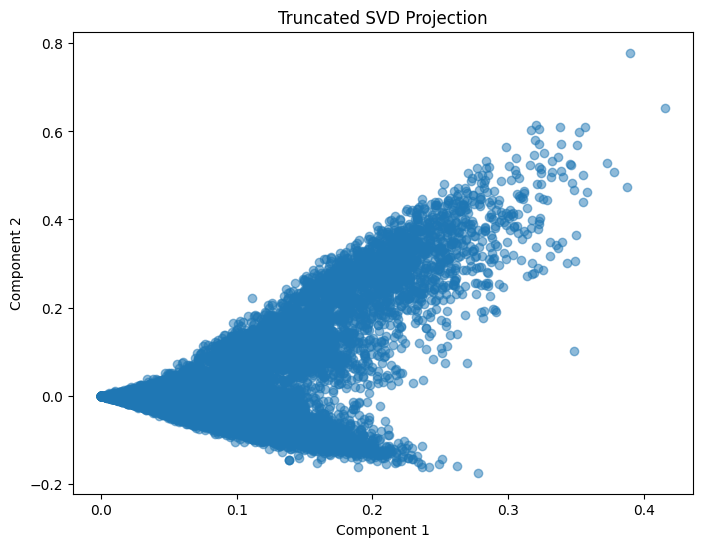

In [ ]:
# Plot Truncated SVD
plt.figure(figsize=(8, 6))
plt.scatter(X_svd[:, 0], X_svd[:, 1], alpha=0.5)
plt.title('Truncated SVD Projection')
plt.xlabel('Component 1')
plt.ylabel('Component 2')
plt.show()

In [ ]:
# UMAP for further non-linear reduction
umap_model = umap.UMAP(n_components=2, n_neighbors=30, min_dist=0.1, random_state=42)
X_umap = umap_model.fit_transform(X_svd)

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


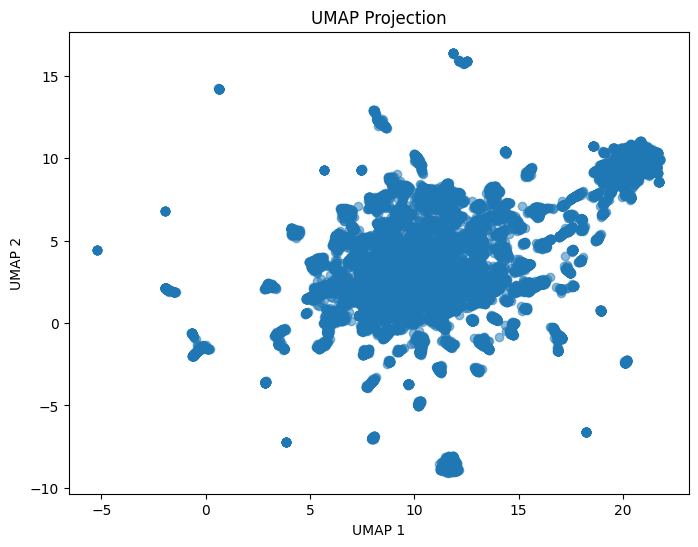

In [ ]:
# Plot UMAP Projection
plt.figure(figsize=(8, 6))
plt.scatter(X_umap[:, 0], X_umap[:, 1], alpha=0.5)
plt.title('UMAP Projection')
plt.xlabel('UMAP 1')
plt.ylabel('UMAP 2')
plt.show()

In [ ]:
# Normalize data
normalizer = Normalizer()
X_normalized = normalizer.fit_transform(X_umap)

In [ ]:
# ----------------- HYPERPARAMETER TUNING -----------------

# Tune K-Means
best_k = None
best_score = -1
silhouette_scores = []
calinski_harabasz_scores = []
inertia_values = []
K = range(2, 30)

for k in K:
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=50, init='k-means++')
    kmeans_labels = kmeans.fit_predict(X_normalized)
    sil_score = silhouette_score(X_normalized, kmeans_labels)
    calinski_score = calinski_harabasz_score(X_normalized, kmeans_labels)
    inertia = kmeans.inertia_

    silhouette_scores.append(sil_score)
    calinski_harabasz_scores.append(calinski_score)
    inertia_values.append(inertia)

    print(f'k={k}, silhouette score={sil_score:.4f}, Calinski-Harabasz score={calinski_score:.4f}, inertia={inertia:.4f}')

    if sil_score > best_score:
        best_score = sil_score
        best_k = k

print(f"Optimal K for KMeans: {best_k}")

k=2, silhouette score=0.5687, Calinski-Harabasz score=39116.9429, inertia=3961.7761
k=3, silhouette score=0.5348, Calinski-Harabasz score=48629.9959, inertia=2397.5176
k=4, silhouette score=0.5235, Calinski-Harabasz score=55738.9256, inertia=1625.3558
k=5, silhouette score=0.5390, Calinski-Harabasz score=70099.8640, inertia=1068.5372
k=6, silhouette score=0.5402, Calinski-Harabasz score=97822.3717, inertia=654.8400
k=7, silhouette score=0.5737, Calinski-Harabasz score=142468.8511, inertia=390.1581
k=8, silhouette score=0.5504, Calinski-Harabasz score=160470.7157, inertia=300.8788
k=9, silhouette score=0.5737, Calinski-Harabasz score=189808.0046, inertia=225.0672
k=10, silhouette score=0.5664, Calinski-Harabasz score=208786.2390, inertia=182.9904
k=11, silhouette score=0.5723, Calinski-Harabasz score=222949.3459, inertia=154.8629
k=12, silhouette score=0.5742, Calinski-Harabasz score=239523.1011, inertia=131.4853
k=13, silhouette score=0.5747, Calinski-Harabasz score=262961.5196, inerti

In [ ]:
# Train final K-Means with best K
kmeans_final = KMeans(n_clusters=best_k, random_state=42, n_init=50)
df['kmeans_cluster'] = kmeans_final.fit_predict(X_normalized)

# Tune GMM
best_gmm = None
best_bic = float("inf")

for n in range(2, 15):
    gmm = GaussianMixture(n_components=n, covariance_type='full', random_state=42)
    gmm.fit(X_normalized)

    bic = gmm.bic(X_normalized)  # Lower is better
    aic = gmm.aic(X_normalized)  # Lower is better

    print(f"GMM Components={n}, BIC={bic:.4f}, AIC={aic:.4f}")

    if bic < best_bic:
        best_bic = bic
        best_gmm = gmm

df['gmm_cluster'] = best_gmm.predict(X_normalized)
print(f"GMM clustering completed with best components={best_gmm.n_components}")

GMM Components=2, BIC=-162167.4465, AIC=-162264.4641
GMM Components=3, BIC=-255368.1109, AIC=-255518.0471
GMM Components=4, BIC=-269229.2335, AIC=-269432.0884
GMM Components=5, BIC=-274388.9971, AIC=-274644.7707
GMM Components=6, BIC=-330963.5065, AIC=-331272.1988
GMM Components=7, BIC=-396982.5286, AIC=-397344.1395
GMM Components=8, BIC=-420859.0768, AIC=-421273.6063
GMM Components=9, BIC=-454982.8103, AIC=-455450.2586
GMM Components=10, BIC=-480872.4020, AIC=-481392.7689
GMM Components=11, BIC=-486854.6919, AIC=-487427.9775
GMM Components=12, BIC=-498321.6679, AIC=-498947.8721
GMM Components=13, BIC=-508698.7761, AIC=-509377.8990
GMM Components=14, BIC=-524188.2022, AIC=-524920.2438
GMM clustering completed with best components=14


In [ ]:
# ----------------- WORD CLOUD VISUALIZATION -----------------

def plot_wordclouds(df, cluster_column, model_name):
    clusters = sorted(df[cluster_column].unique())

    fig, axes = plt.subplots((len(clusters) // 2) + 1, 2, figsize=(15, len(clusters) * 3))
    axes = axes.flatten()

    for idx, cluster in enumerate(clusters):
        cluster_texts = df[df[cluster_column] == cluster]['filtered_text']
        wordcloud = WordCloud(width=400, height=400, background_color='white', colormap='tab10').generate(' '.join(cluster_texts))

        axes[idx].imshow(wordcloud, interpolation='bilinear')
        axes[idx].set_title(f'Cluster {cluster}')
        axes[idx].axis('off')

    plt.suptitle(f'Word Clouds for {model_name} Clusters')
    plt.tight_layout()
    plt.show()


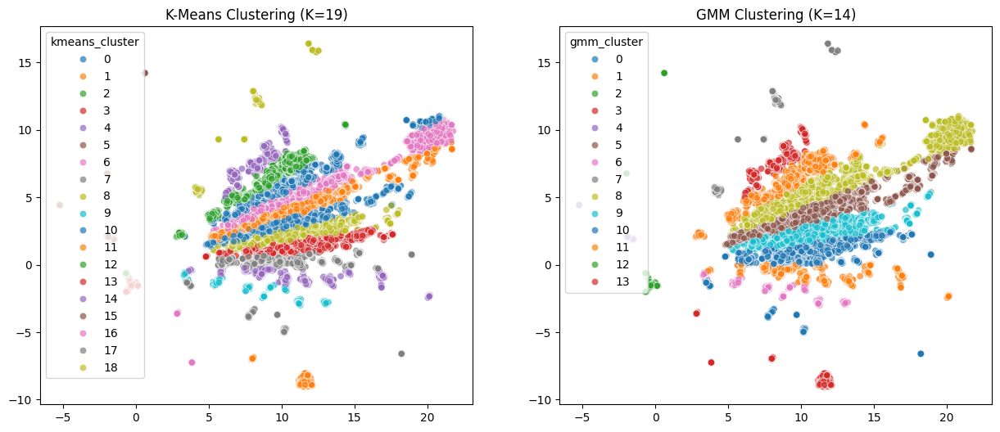

Clustering visualization completed.


In [ ]:
# ----------------- CLUSTERING VISUALIZATION -----------------

# Plot Clusters
fig, axes = plt.subplots(1, 2, figsize=(15, 6))

sns.scatterplot(x=X_umap[:, 0], y=X_umap[:, 1], hue=df['kmeans_cluster'], palette='tab10', alpha=0.7, ax=axes[0])
axes[0].set_title(f'K-Means Clustering (K={best_k})')

sns.scatterplot(x=X_umap[:, 0], y=X_umap[:, 1], hue=df['gmm_cluster'], palette='tab10', alpha=0.7, ax=axes[1])
axes[1].set_title(f'GMM Clustering (K={best_gmm.n_components})')

plt.show()
print("Clustering visualization completed.")

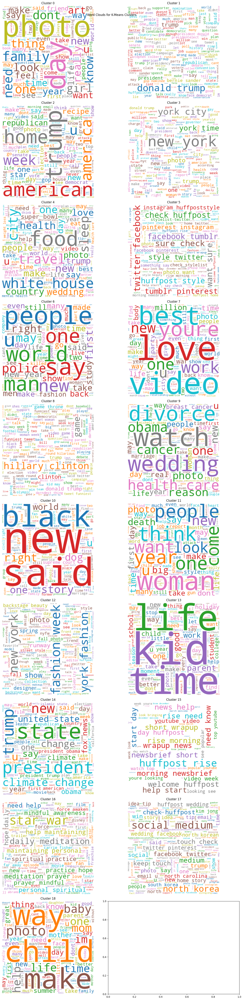

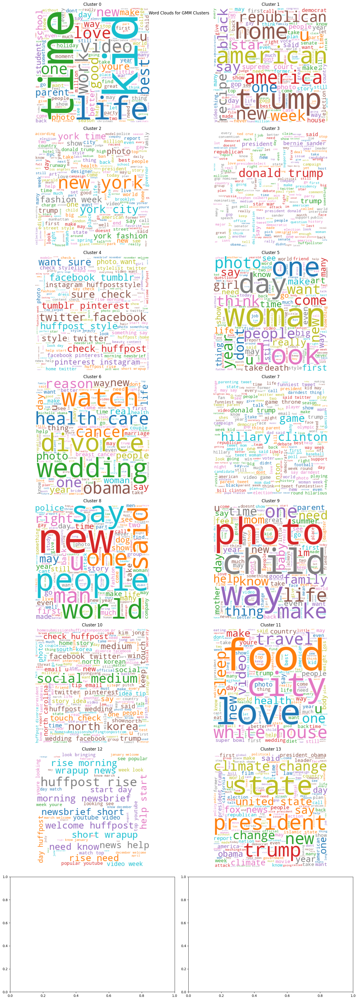

Word cloud visualization completed.


In [ ]:
# Plot Word Clouds for KMeans and GMM
plot_wordclouds(df, 'kmeans_cluster', 'K-Means')
plot_wordclouds(df, 'gmm_cluster', 'GMM')

print("Word cloud visualization completed.")